In [1]:
import re
import time
import datetime
from dateutil.relativedelta import relativedelta
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'. Needed to remove SettingWithCopyWarning warning when assigning new value to dataframe column
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline
import seaborn as sns
import plotly.express as px

import statsmodels.formula.api as smf
import scipy.stats as stats

%load_ext autoreload
%autoreload 2

from housing_crawler.utils import save_file, get_file, crawl_ind_ad_page
from housing_crawler.analysis.ads_table_processing import prepare_data, filter_out_bad_entries, transform_columns_into_numerical, hot_encode_columns, feature_engineering


In [2]:
all_ads = get_file(file_name='all_encoded.csv', local_file_path=f'housing_crawler/data')

df_processed = prepare_data(ads_df = all_ads)
df_processed = filter_out_bad_entries(ads_df = df_processed, country = 'Germany',
                       price_max = 6000, price_min = 50,
                      size_max = 400, size_min = 3,
                      date_max = None, date_min = None, date_format = "%d.%m.%Y")
df_processed = transform_columns_into_numerical(ads_df = df_processed)
# df_processed = hot_encode_columns(ads_df = df_processed)
df_processed = feature_engineering(ads_df = df_processed)

ads_df = df_processed.drop(columns=['crawler','details_searched', 'cold_rent_euros',
       'mandatory_costs_euros', 'extra_costs_euros', 'transfer_costs_euros',
       'deposit', 'zip_code', 'home_total_size', 'smoking', 'wg_type',
       'age_range', 'gender_search', 'energy', 'wg_possible', 'building_type',
       'building_floor', 'furniture', 'kitchen', 'shower_type', 'tv',
       'floor_type', 'heating', 'public_transport_distance', 'internet',
       'parking', 'schufa_needed', 'extras_waschmaschine',
       'extras_spuelmaschine', 'extras_terrasse', 'extras_balkon',
       'extras_garten', 'extras_gartenmitbenutzung', 'extras_keller',
       'extras_aufzug', 'extras_haustiere', 'extras_fahrradkeller',
       'extras_dachboden', 'languages_deutsch', 'languages_englisch',
       'number_languages', 'min_age_flatmates', 'max_age_flatmates'])

===> Loaded all_encoded.csv locally


In [3]:
ads_df = ads_df.set_index('id')
for ad_id in ads_df.index[:100]:
    if ads_df.loc[ad_id]["type_offer_simple"] == 'WG':
        ads_df.loc[ad_id]["price_per_sqm"] = ads_df.loc[ad_id]["price_per_sqm"]/(ads_df.loc[ad_id]["capacity"])

ads_df = ads_df.reset_index()


In [4]:
ads_df.head(20)

,id,url,landlord_type,title,price_euros,size_sqm,available_rooms,capacity,available_spots_wg,male_flatmates,...,address,city,latitude,longitude,available_from,available_to,type_offer_simple,day_of_week_publication,price_per_sqm,days_available
0,9535544,https://www.wg-gesucht.de/wohnungen-in-Berlin-...,Private,"Large two bedroom flat, beautiful Altbau, full...",2000.0,110,2.0,0,0,0,...,"Hasenheide 62, 10967, Berlin",Berlin,52.488730,13.408471,2022-10-01,2022-10-31,Apartment,Sun,18.180000,30
1,6218731,https://www.wg-gesucht.de/wohnungen-in-Berlin-...,Private,Brooklyn-style möblierte Wohnung in Prenzlauer...,1100.0,56,2.0,0,0,0,...,"Schliemannstraße 46, 10437, Berlin",Berlin,52.541207,13.416895,2022-09-01,2022-11-30,Apartment,Sun,19.640000,90
2,8010325,https://www.wg-gesucht.de/wg-zimmer-in-Berlin-...,Private,2er WG möbliert,570.0,15,1.0,2,1,0,...,"Ilmenauer Str, 14193, Berlin",Berlin,52.481274,13.287252,2022-10-01,NaT,WG,Sun,19.000000,365
3,7938351,https://www.wg-gesucht.de/wg-zimmer-in-Berlin-...,Private,Zimmer in Berlin-Kreuzberg,750.0,20,1.0,4,1,1,...,"Franz Klühs Straße, 10969, Berlin",Berlin,52.501101,13.394290,2022-08-14,2022-10-31,WG,Sun,9.375000,78
4,9541826,https://www.wg-gesucht.de/wohnungen-in-Berlin-...,Private,Schöne Altbauwohnung Kreuzberg,450.0,70,2.0,0,0,0,...,"Pücklerstraße 31, 10997, Berlin",Berlin,52.501492,13.430200,2022-09-28,2022-10-05,Apartment,Sun,6.430000,7
5,9541806,https://www.wg-gesucht.de/1-zimmer-wohnungen-i...,Private,Neuwertiges und möbliertes Apartment direkt am...,1000.0,26,1.0,0,0,0,...,"Mariannenplatz 21, 10997, Berlin",Berlin,52.503898,13.426397,2022-09-01,2024-04-30,Single-room flat,Sun,38.460000,607
6,8168115,https://www.wg-gesucht.de/wg-zimmer-in-Berlin-...,Private,Interview end of August - 2er WG,570.0,21,1.0,2,1,0,...,"Reichenberger Straße, 10999, Berlin",Berlin,52.497689,13.423061,2022-09-19,2023-09-19,WG,Sun,13.570000,365
7,9541180,https://www.wg-gesucht.de/1-zimmer-wohnungen-i...,Private,Schöne Einzimmerwohnung nahe S- und U-Bahn Pan...,820.0,36,1.0,0,0,0,...,"Görschstraße, 13187, Berlin",Berlin,52.566326,13.399942,2022-09-15,2023-03-15,Single-room flat,Sun,22.780000,181
8,9237050,https://www.wg-gesucht.de/wohnungen-in-Berlin-...,Private,Wunderschöne zwei Zimmerwohnung im Gräfekiez,310.0,50,2.0,0,0,0,...,"Fichtestraße, 10967, Berlin",Berlin,52.490140,13.413273,2022-08-26,2022-09-11,Apartment,Sun,6.200000,16
9,9540777,https://www.wg-gesucht.de/wg-zimmer-in-Berlin-...,Private,WG-Zimmer - 3 Wochen Zwischenmiete (20.08-11.0...,500.0,20,1.0,4,1,3,...,"Friedbergstraße, 14057, Berlin",Berlin,52.503650,13.291614,2022-08-20,2022-09-11,WG,Sun,6.250000,22


In [5]:
ads_df.columns

Index(['id', 'url', 'landlord_type', 'title', 'price_euros', 'size_sqm',
       'available_rooms', 'capacity', 'available_spots_wg', 'male_flatmates',
       'female_flatmates', 'diverse_flatmates', 'published_on', 'published_at',
       'address', 'city', 'latitude', 'longitude', 'available_from',
       'available_to', 'type_offer_simple', 'day_of_week_publication',
       'price_per_sqm', 'days_available'],
      dtype='object')

In [6]:
typeoffer_ads_df = ads_df[['url', 'type_offer_simple']].groupby('type_offer_simple').count().rename(columns={'url':'count'}).sort_values(by = ['count'], ascending=False)
typeoffer_ads_df

,count
type_offer_simple,
WG,38643
Apartment,7138
Single-room flat,6609
House,108


In [7]:
## Filter type of offer
wg_df = ads_df.query('type_offer_simple == "WG"\
                     & price_euros <= 2000\
                     & price_euros > 100\
                     & size_sqm <= 60\
                     & size_sqm >= 3').reset_index().drop(columns=['index'])

singleroom_df = ads_df.query('type_offer_simple == "Single-room flat"\
                     & price_euros <= 2500\
                     & price_euros > 100\
                     & size_sqm <= 100\
                     & size_sqm >= 10').reset_index().drop(columns=['index'])

flathouse_df = ads_df.query('(type_offer_simple == "Apartment")\
                     & price_euros <= 6000\
                     & price_euros > 100\
                     & size_sqm <= 300\
                     & size_sqm >= 25').reset_index().drop(columns=['index'])

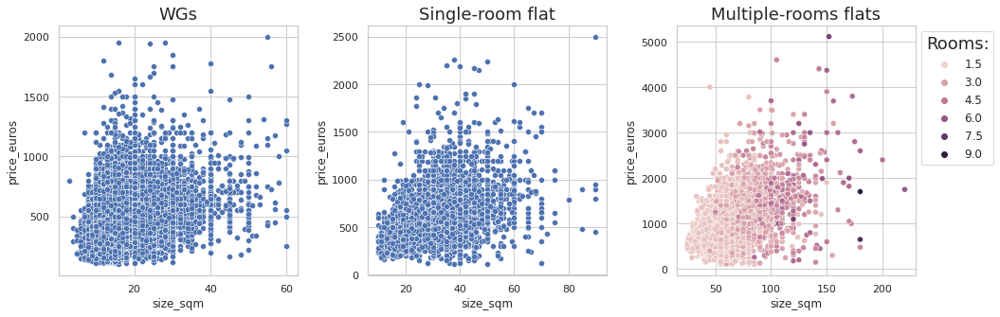

In [8]:
sns.set_theme(style = "whitegrid", font_scale= 1)
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(15, 5))

sns.set_theme(style = "whitegrid", font_scale= 1.5)
sns.scatterplot(data = wg_df, y='price_euros',x='size_sqm', ax=ax1).set(title='WGs')
sns.scatterplot(data = singleroom_df, y='price_euros',x='size_sqm', ax=ax2).set(title='Single-room flat')
sns.scatterplot(data = flathouse_df, y='price_euros',x='size_sqm', ax=ax3, hue = 'available_rooms').set(title='Multiple-rooms flats')
ax3.legend(title='Rooms:', fontsize=12, bbox_to_anchor= (1,1))# loc='upper right')
plt.tight_layout();

In [9]:
dayweek_wg_df = wg_df[['url', 'day_of_week_publication']].groupby('day_of_week_publication').count().rename(columns={'url':'count'})
dayweek_wg_df['order'] = [5,1,6,7,4,2,3]
dayweek_wg_df = dayweek_wg_df.sort_values(by = ['order']).drop(['order'], axis=1)
dayweek_wg_df['Percentage'] = dayweek_wg_df['count'].apply(lambda x: round(100*x/sum(dayweek_wg_df['count']),2))
dayweek_wg_df

,count,Percentage
day_of_week_publication,,
Mon,7218,18.74
Tue,6124,15.90
Wed,5925,15.38
Thu,4684,12.16
Fri,4742,12.31
Sat,4652,12.08
Sun,5169,13.42


In [10]:
hourday_wg_df = wg_df[['url', 'published_at']].groupby('published_at').count().rename(columns={'url':'count'})
hourday_wg_df['Percentage'] = hourday_wg_df['count'].apply(lambda x: round(100*x/sum(hourday_wg_df['count']),2))
hourday_wg_df

,count,Percentage
published_at,,
0,827,2.88
1,315,1.10
2,151,0.53
3,63,0.22
4,42,0.15
5,47,0.16
6,68,0.24
7,211,0.73
8,552,1.92


In [11]:
city_wg_df = wg_df[['url', 'city']].groupby('city').count().rename(columns={'url':'count'}).sort_values(by = ['count'], ascending=False)
city_wg_df['Percentage'] = city_wg_df['count'].apply(lambda x: round(100*x/sum(city_wg_df['count']),2))
city_wg_df

,count,Percentage
city,,
Berlin,5319,13.81
München,3635,9.44
Hamburg,2793,7.25
Stuttgart,2601,6.75
Köln,2263,5.88
Leipzig,1777,4.61
Münster,1718,4.46
Frankfurt am Main,1650,4.28
Karlsruhe,1535,3.99


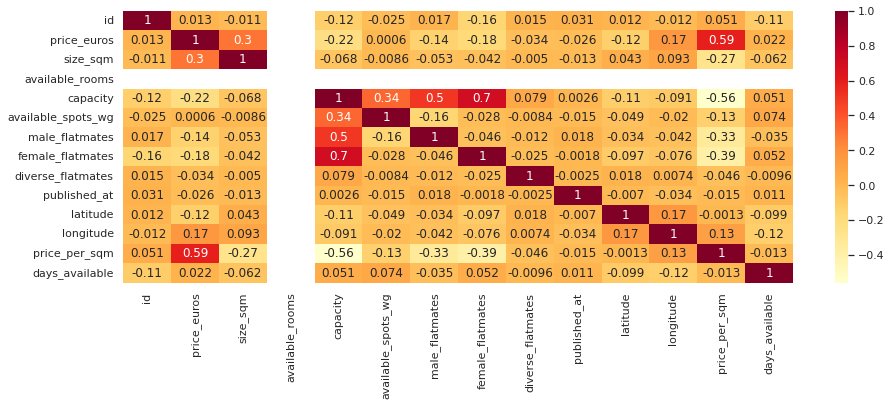

In [12]:
sns.set_theme(style = "whitegrid", font_scale= 1)
fig, ax1 = plt.subplots(nrows=1, ncols=1, figsize=(15, 5))

sns.heatmap(wg_df.corr(), cmap='YlOrRd', 
            annot = True, 
            annot_kws={"size": 12});

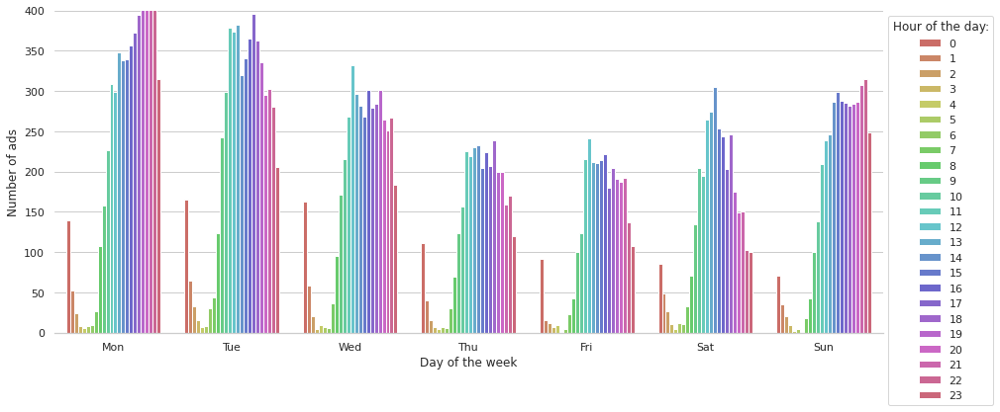

In [13]:
sns.set_theme(style = "whitegrid", font_scale= 1)
fig, ax = plt.subplots(figsize=(15,6))

sns.countplot(
    data=wg_df[['day_of_week_publication','published_at']].dropna(axis=0),
    x="day_of_week_publication",
    hue = 'published_at',
    order=['Mon', 'Tue', 'Wed', "Thu", "Fri", "Sat", "Sun"],
    palette='hls', # or husl are exampels of circular color palletes
    ax=ax)
plt.legend(bbox_to_anchor = (1, 1), title = 'Hour of the day:')
sns.despine(top=True,left=True,right=True) # Background grid borders
ax.set(ylim=(0, 400), ylabel="Number of ads", xlabel="Day of the week");

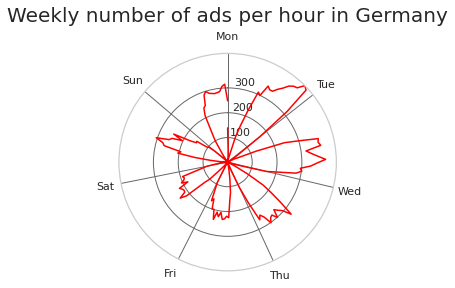

In [14]:
day_week_map = {'Mon':0,'Tue':1,'Wed':2,'Thu':3,'Fri':4,'Sat':5,'Sun':6}
foo = wg_df.copy()
foo['day_week_number'] = foo['day_of_week_publication'].map(day_week_map)
foo = foo.sort_values(by = ['day_week_number'], ascending=True)
foo['week_hour_publication'] = foo['day_week_number']*24 + foo['published_at'] 
foo = foo[['url','week_hour_publication']].dropna(axis=0).groupby(['week_hour_publication']).count().rename(columns = {'url':'count'}).reset_index()



plotting_values = [float(i)*np.pi/180.0 for i in list(np.arange(0, 361, 360/max(foo['week_hour_publication'])))]
mapping_dict = dict(zip(range(0,max(foo['week_hour_publication'])+1), plotting_values))
foo['week_hour_publication_radians'] = foo['week_hour_publication'].map(mapping_dict)

colors = ['orange', 'yellow', 'green', 'blue', 'purple', 'black', 'red']
days_of_week = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

ax = plt.subplot(111, projection='polar')


foo.plot(x='week_hour_publication_radians', y='count', color ='red', ax=ax)


ax.grid(True)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)


ax.xaxis.set_ticks(plotting_values[::24])
ax.set_xticklabels(days_of_week)
ax.set_xlabel('')

ax.set_rmax(450)
ax.set_rticks([100,200,300])
ax.set_rlabel_position(5)  # Rotate labels

ax.get_legend().remove()
#change colors of axis to gray
ax.xaxis.grid(True,color='dimgray',linestyle='-', linewidth = 1)
ax.yaxis.grid(True,color='dimgray',linestyle='-', linewidth = 1)

ax.set_title("Weekly number of ads per hour in Germany", va='bottom', fontsize=20)
ax.margins(0)
plt.show()

''

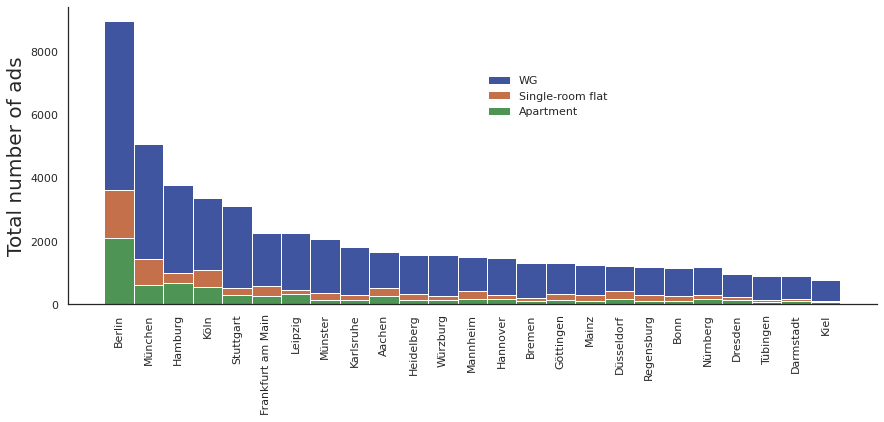

In [15]:
city_ads_df = ads_df[['url', 'city']].groupby('city').count().sort_values(by = ['url'], ascending=False)
reorderlist = list(city_ads_df.index)
ads_df_ordered_counts = ads_df.iloc[pd.Categorical(ads_df.city,reorderlist).argsort()]


sns.set_theme(style = "white", font_scale= 1)
ax = sns.displot(x='city', data=ads_df_ordered_counts, hue='type_offer_simple',
            hue_order=['WG', 'Single-room flat','Apartment'],
#             hue_labels=['WG', 'Single-room flat','Multi'],
            multiple='stack',
            height=5, aspect=10/4,
            palette='dark',
           )

# ax.set(ylim=(0, 8000));
ax.set_xticklabels(rotation = 90)
ax.set_ylabels(label="Total number of ads", fontsize=20)
ax.set_xlabels('', fontsize=20)

sns.move_legend(ax, loc = "upper right", bbox_to_anchor= (0.6,0.8), title = '')
;

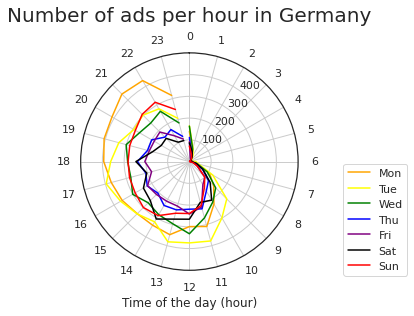

In [16]:
wg_df_time = wg_df[['url', 'day_of_week_publication','published_at']].groupby(['day_of_week_publication','published_at']).count().rename(columns = {'url':'count'}).reset_index()

plotting_values = [float(i)*np.pi/180.0 for i in list(np.arange(0, 360, 360/24))]
mapping_dict = dict(zip(range(0,24), plotting_values))
wg_df_time['published_at_radians'] = wg_df_time.published_at.map(mapping_dict)

colors = ['orange', 'yellow', 'green', 'blue', 'purple', 'black', 'red']
days_of_week = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']

ax = plt.subplot(111, projection='polar')

for day_i in range(7):
    # Filter day week
    foo = wg_df_time[wg_df_time['day_of_week_publication'] == days_of_week[day_i]]
    foo.plot('published_at_radians', 'count', color = colors[day_i], label = days_of_week[day_i], ax=ax)


ax.grid(True)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)


ax.xaxis.set_ticks(plotting_values)
ax.set_xticklabels(np.arange(0, 24, 1))
ax.set_xlabel('Time of the day (hour)')

ax.set_rmax(500)
ax.set_rticks([100,200,300,400])
ax.set_rlabel_position(35)  # Rotate labels

# Legend positioning
angle = np.deg2rad(-30)
ax.legend(loc="lower left",
          bbox_to_anchor=(0.75 + np.cos(angle)/2, # Horizontal distance from center
                          .2 + np.sin(angle)/2)) # Vertical distance from center

ax.set_title("Number of ads per hour in Germany", va='bottom', fontsize=20)
plt.show()

''

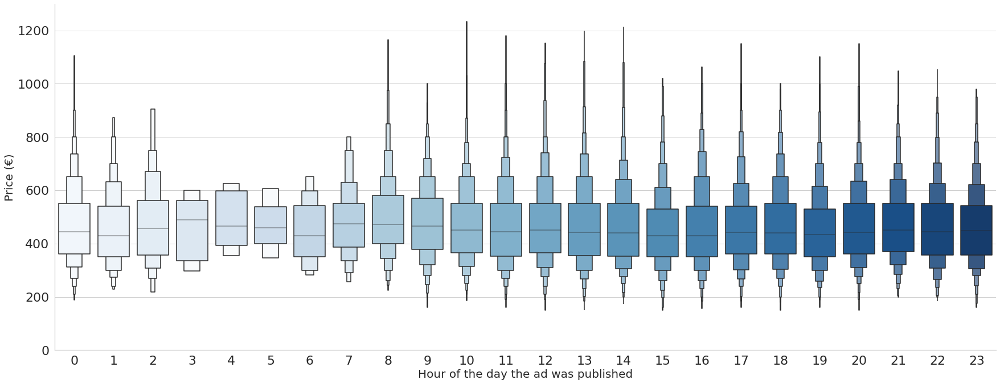

In [17]:
sns.set_theme(style = "whitegrid", font_scale= 2)
ax = sns.catplot(data = wg_df[['published_at','price_euros']].dropna(axis=0), 
                 x = 'published_at', y = 'price_euros',
                 kind='boxen',
                 palette='Blues',
                 height=10, aspect=10/4, showfliers = False)
ax.set(ylim=(0, 1300))
ax.set_ylabels(label="Price (€)", fontsize=20) # not set_label
ax.set_xlabels('Hour of the day the ad was published', fontsize=20) # not set_label
;

''

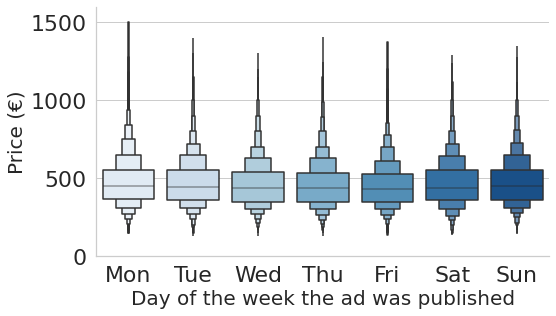

In [18]:
sns.set_theme(style = "whitegrid", font_scale= 2)
ax = sns.catplot(data = wg_df, 
                 x = 'day_of_week_publication', y = 'price_euros',
                 order=['Mon', 'Tue', 'Wed', "Thu", "Fri", "Sat", "Sun"],
                 kind='boxen',
                 palette='Blues',
                 height=5, aspect=10/6, showfliers = False)
ax.set(ylim=(0, 1600))
ax.set_ylabels(label="Price (€)", fontsize=20) # not set_label
ax.set_xlabels('Day of the week the ad was published', fontsize=20) # not set_label
;

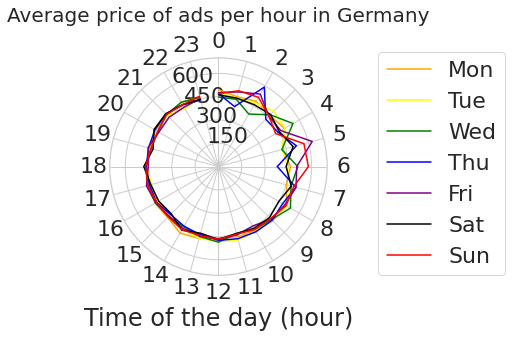

In [19]:
wg_df_time = wg_df[['price_euros', 'day_of_week_publication','published_at']].groupby(['day_of_week_publication','published_at']).mean().reset_index()

plotting_values = [float(i)*np.pi/180.0 for i in list(np.arange(0, 360, 360/24))]
mapping_dict = dict(zip(range(0,24), plotting_values))
wg_df_time['published_at_radians'] = wg_df_time.published_at.map(mapping_dict)

colors = ['orange', 'yellow', 'green', 'blue', 'purple', 'black', 'red']
days_of_week = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']


sns.set_theme(style = "whitegrid", font_scale= 2)
ax = plt.subplot(111, projection='polar')

for day_i in range(7):
    # Filter day week
    foo = wg_df_time[wg_df_time['day_of_week_publication'] == days_of_week[day_i]]
    foo.plot('published_at_radians', 'price_euros', color = colors[day_i], label = days_of_week[day_i], ax=ax)


ax.grid(True)
ax.set_theta_zero_location("N")
ax.set_theta_direction(-1)


ax.xaxis.set_ticks(plotting_values)
ax.set_xticklabels(np.arange(0, 24, 1))
ax.set_xlabel('Time of the day (hour)')

ax.set_rmax(700)
ax.set_rticks([150,300,450,600])  # Move radial labels away from plotted line
ax.set_rlabel_position(-30)  # Rotate labels

# Legend positioning
angle = np.deg2rad(-30)
ax.legend(loc="lower left",
          bbox_to_anchor=(0.75 + np.cos(angle)/2, # Horizontal distance from center
                          .2 + np.sin(angle)/2)) # Vertical distance from center

ax.set_title("Average price of ads per hour in Germany", va='bottom', fontsize=20)
plt.show()

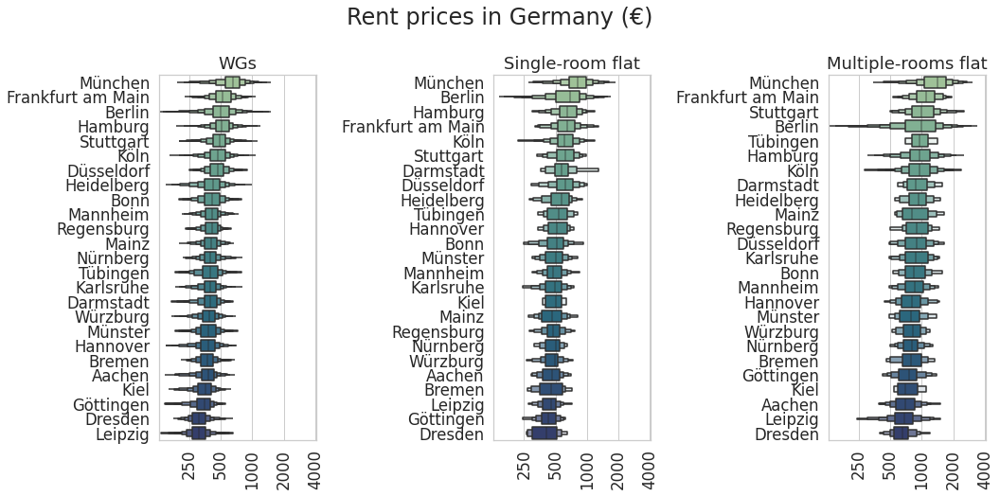

In [20]:
# Finding the order
city_wg_df = wg_df[['price_euros', 'city']].groupby('city').mean().sort_values(by = ['price_euros'], ascending=False)
city_singleroom_df = singleroom_df[['price_euros', 'city']].groupby('city').mean().sort_values(by = ['price_euros'], ascending=False)
city_flathouse_df = flathouse_df[['price_euros', 'city']].groupby('city').mean().sort_values(by = ['price_euros'], ascending=False)

# Log transform prices
wg_df_mod = wg_df.copy()
wg_df_mod['price_euros'] = np.log2(wg_df_mod['price_euros'])

singleroom_df_mod = singleroom_df.copy()
singleroom_df_mod['price_euros'] = np.log2(singleroom_df_mod['price_euros'])

flathouse_df_mod = flathouse_df.copy()
flathouse_df_mod['price_euros'] = np.log2(flathouse_df_mod['price_euros'])

# Figure
sns.set_theme(style = "whitegrid", font_scale= 1.5)
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(15, 7.5))

sns.boxenplot(data = wg_df_mod, y = 'city', x = 'price_euros',
            order = city_wg_df.index,
            palette='crest', showfliers = False,
            ax=ax1).set(title='WGs')

sns.boxenplot(data = singleroom_df_mod, y = 'city', x = 'price_euros',
            order = city_singleroom_df.index,
            palette='crest', showfliers = False,
            ax=ax2).set(title='Single-room flat')

sns.boxenplot(data = flathouse_df_mod, y = 'city', x = 'price_euros',
            order = city_flathouse_df.index,
            palette='crest', showfliers = False,
            ax=ax3).set(title='Multiple-rooms flat')

ax1.set(xlim=(7, 12), xlabel=None, ylabel=None)
ax1.set_xticks([np.log2(250),np.log2(500),np.log2(1000),np.log2(2000),np.log2(4000)])
ax1.set_xticklabels(rotation = 90, labels =[250,500,1000,2000,4000])


ax2.set(xlim=(7, 12), xlabel=None, ylabel=None)
ax2.set_xticks([np.log2(250),np.log2(500),np.log2(1000),np.log2(2000),np.log2(4000)])
ax2.set_xticklabels(rotation = 90, labels =[250,500,1000,2000,4000])

ax3.set(xlim=(7, 12), xlabel=None, ylabel=None)
ax3.set_xticks([np.log2(250),np.log2(500),np.log2(1000),np.log2(2000),np.log2(4000)])
ax3.set_xticklabels(rotation = 90, labels =[250,500,1000,2000,4000])
fig.suptitle('Rent prices in Germany (€)', fontsize=24)

plt.tight_layout();

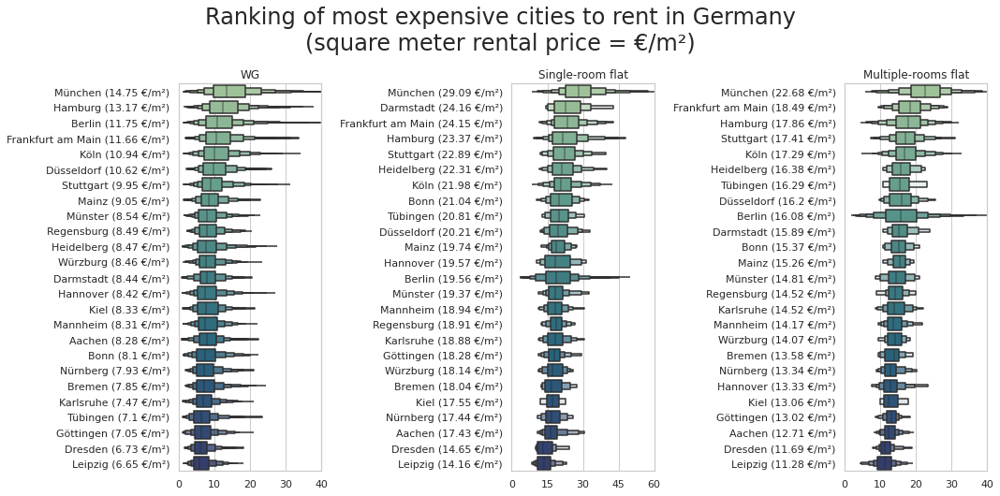

In [21]:
# Finding the order
city_wg_df = wg_df[['price_per_sqm', 'city']].groupby('city').mean().sort_values(by = ['price_per_sqm'], ascending=False)
city_singleroom_df = singleroom_df[['price_per_sqm', 'city']].groupby('city').mean().sort_values(by = ['price_per_sqm'], ascending=False)
city_flathouse_df = flathouse_df[['price_per_sqm', 'city']].groupby('city').mean().sort_values(by = ['price_per_sqm'], ascending=False)

# Log transform prices
# wg_df_mod = wg_df.copy()
# wg_df_mod['price_per_sqm'] = np.log2(wg_df_mod['price_per_sqm'])

# singleroom_df_mod = singleroom_df.copy()
# singleroom_df_mod['price_per_sqm'] = np.log2(singleroom_df_mod['price_per_sqm'])

# flathouse_df_mod = flathouse_df.copy()
# flathouse_df_mod['price_per_sqm'] = np.log2(flathouse_df_mod['price_per_sqm'])

# Figure
sns.set_theme(style = "whitegrid", font_scale= 1)
fig, (ax1, ax2, ax3) = plt.subplots(nrows=1, ncols=3, figsize=(15, 7.5))

sns.boxenplot(data = wg_df, y = 'city', x = 'price_per_sqm',
            order = city_wg_df.index,
            palette='crest', showfliers = False,
            ax=ax1).set(title='WG')

sns.boxenplot(data = singleroom_df, y = 'city', x = 'price_per_sqm',
            order = city_singleroom_df.index,
            palette='crest', showfliers = False,
            ax=ax2).set(title='Single-room flat')

sns.boxenplot(data = flathouse_df, y = 'city', x = 'price_per_sqm',
            order = city_flathouse_df.index,
            palette='crest', showfliers = False,
            ax=ax3).set(title='Multiple-rooms flat')

ax1.set(xlim=(0, 40), xlabel=None, ylabel=None)
ax1.set_xticks(range(0,41,10))
name_city_price = []

for city in city_wg_df.index:
    name_city_price.append(f'{city} ({round(city_wg_df.loc[city]["price_per_sqm"],2)} €/m²)')
ax1.set_yticks(range(0,25), name_city_price)



ax2.set(xlim=(0, 60), xlabel=None, ylabel=None)
ax2.set_xticks(range(0,61,15))

name_city_price = []
for city in city_singleroom_df.index:
    name_city_price.append(f'{city} ({round(city_singleroom_df.loc[city]["price_per_sqm"],2)} €/m²)')
ax2.set_yticks(range(0,25), name_city_price)



ax3.set(xlim=(0, 40), xlabel=None, ylabel=None)
ax3.set_xticks(range(0,41,10))

name_city_price = []
for city in city_flathouse_df.index:
    name_city_price.append(f'{city} ({round(city_flathouse_df.loc[city]["price_per_sqm"],2)} €/m²)')
ax3.set_yticks(range(0,25), name_city_price)



fig.suptitle('Ranking of most expensive cities to rent in Germany\n(square meter rental price = €/m²)', fontsize=24)

plt.tight_layout();

''

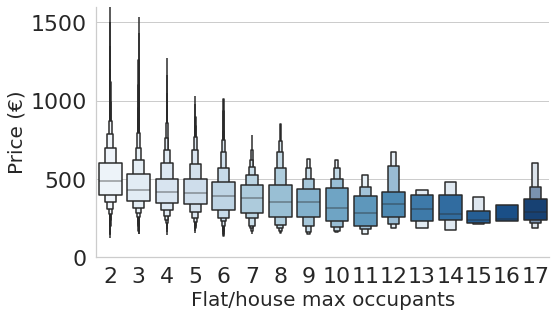

In [22]:
sns.set_theme(style = "whitegrid", font_scale= 2)
ax = sns.catplot(data = wg_df, 
                 x = 'capacity', y = 'price_euros',
                 kind='boxen',
                 palette='Blues',
                 height=5, aspect=10/6, showfliers = False)
ax.set(ylim=(0, 1600))
ax.set_ylabels(label="Price (€)", fontsize=20) # not set_label
ax.set_xlabels('Flat/house max occupants', fontsize=20) # not set_label
;

In [23]:
def create_ridgeline_plot(df = wg_df,
                          column = 'price_euros',
                          factor = 'city',
                          max_x = 1200, min_x = 0,
                          max_y = 0.008, min_y = 0,
                          pal_name = 'crest',
                         title = 'WG rent in Germany,\n rent (€)', unit='€'):
    
    foo_df = df[[column, factor]].groupby(by=factor).mean().sort_values(by = column, ascending=False).reset_index().copy()
    ordered_factors = foo_df[factor].tolist()
    mapping_dict = dict(zip(ordered_factors, range(1,len(ordered_factors)+1,1)))
    # Map city order for plotting
    df['order_factors'] = df[factor].map(mapping_dict)

    # Limit prices for the plot
    df = df[df[column] <= max_x]
    df = df[df[column] >= min_x]

    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})  

    # we generate a color palette with Seaborn.color_palette()
    pal = sns.color_palette(palette=pal_name, n_colors=len(ordered_factors))  

    # in the sns.FacetGrid class, the 'hue' argument is the one that is the one that will be represented by colors with 'palette'
    g = sns.FacetGrid(df, row='order_factors', hue='order_factors', aspect=10, height=1, palette=pal)

    # then we add the densities kdeplots for each city
    g.map(sns.kdeplot, column,
          bw_adjust=1, clip_on=False,
          fill=True, alpha=1, linewidth=1.5)

    # here we add a white line that represents the contour of each kdeplot
    g.map(sns.kdeplot, column, 
          bw_adjust=1, clip_on=False, 
          color="w", lw=3)

    # here we add a horizontal line for each plot
    g.map(plt.axhline, y=0,
          lw=0.25, clip_on=False)

    # we loop over the FacetGrid figure axes (g.axes.flat) and add the month as text with the right color
    # notice how ax.lines[-1].get_color() enables you to access the last line's color in each matplotlib.Axes
    for i, ax in enumerate(g.axes.flat):
        factor_name = list(mapping_dict.keys())[i]
        mean_value = round(float(foo_df[foo_df[factor] == factor_name][column]),2)
        
        ax.text(-(max_x+abs(min_x))/5, max_y/10, # Text location
                f'{factor_name}\nmean = {mean_value} {unit}', # Text label
                fontsize=15,
                color=ax.lines[-1].get_color()) # Text color

    # we use matplotlib.Figure.subplots_adjust() function to get the subplots to overlap
    g.fig.subplots_adjust(hspace=-0.75)

    # eventually we remove axes titles, yticks and spines
    g.set_titles("")
    g.set(ylabel = '', yticks=[], ylim = (min_y,max_y), xlim = (-(max_x+abs(min_x))/5, max_x))
    g.despine(bottom=True, left=True)

    plt.setp(ax.get_xticklabels(), fontsize=20)
    plt.xlabel('', fontsize=20)
    plt.ylabel('')
    g.fig.suptitle(title,
                   ha='center',
                   fontsize=20,
                   fontweight=20);
    
    return g

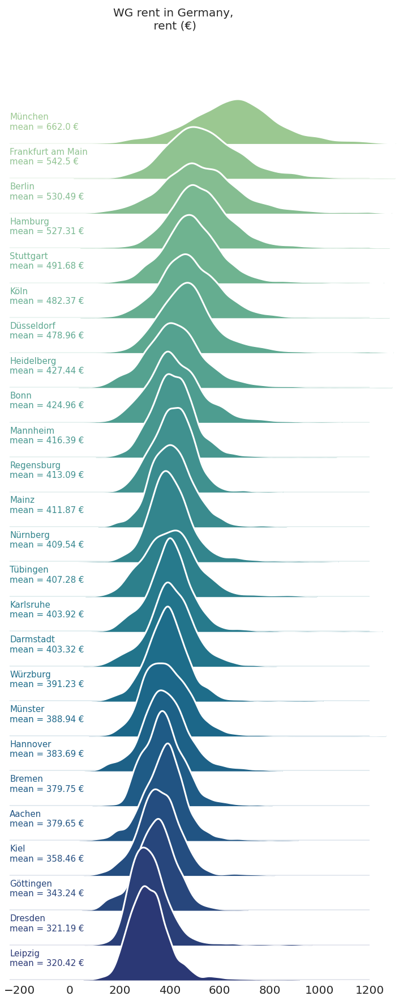

In [24]:
create_ridgeline_plot(df = wg_df,
                          column = 'price_euros',
                          factor = 'city',
                          max_x = 1200, min_x = 0,
                          max_y = 0.008, min_y = 0,
                          pal_name = 'crest',
                         title = 'WG rent in Germany,\n rent (€)');

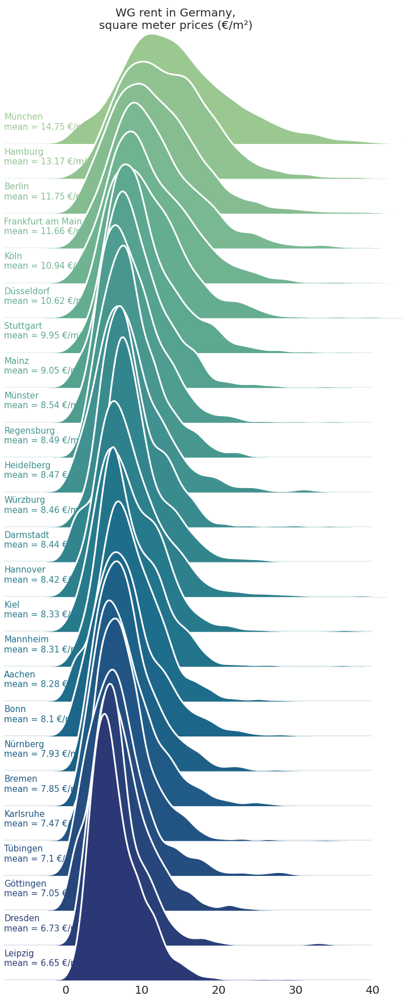

In [25]:
create_ridgeline_plot(df = wg_df,
                          column = 'price_per_sqm',
                          factor = 'city',
                          max_x = 40, min_x = 0,
                          max_y = 0.08, min_y = 0,
                          pal_name = 'crest',
                         title = 'WG rent in Germany,\nsquare meter prices (€/m²)', unit = '€/m²');

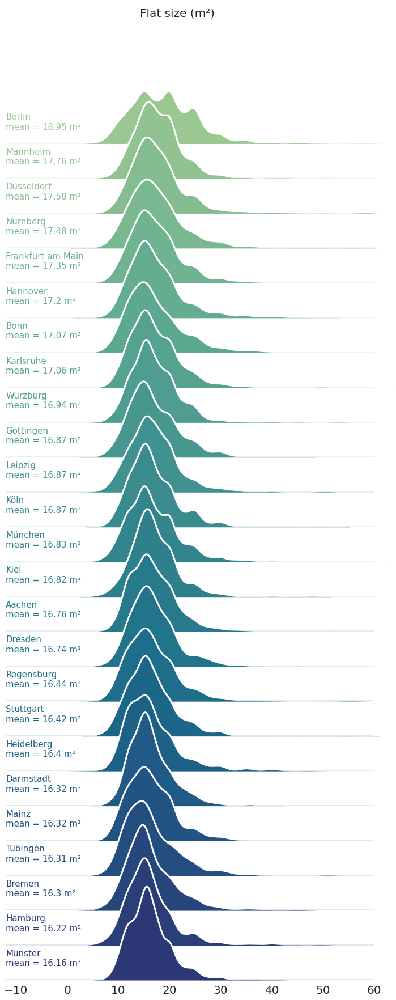

In [26]:
create_ridgeline_plot(df = wg_df,
                          column = 'size_sqm',
                          factor = 'city',
                          max_x = 60, min_x = 0,
                          max_y = 0.182, min_y = 0,
                          pal_name = 'crest',
                         title = 'Flat size (m²)', unit = 'm²');

sns.pairplot(iris, hue="species", palette="Set2", diag_kind="kde", height=2.5)

In [27]:
# Generate tables for plotting
ads_df_grouped = ads_df[['price_per_sqm', 'city', 'type_offer_simple']].groupby(['city','type_offer_simple']).mean().reset_index()
ads_df_grouped = ads_df_grouped.pivot(index='city', columns = 'type_offer_simple', values='price_per_sqm').reset_index()

from plotly.subplots import make_subplots

fig = make_subplots(
    rows=1, cols=3)#,
#     subplot_titles=("WG X multi-room flat", "WG X Single-room flat", "multi-room flat X Single-room flat"))

ax1= px.scatter(data_frame = ads_df_grouped, y='Apartment',x='WG', color = 'city')
for index in range(len(ax1['data'])):
    fig.add_trace(ax1['data'][index],
                  row=1, col=1)

ax2= px.scatter(data_frame = ads_df_grouped, y='Single-room flat',x='WG', color = 'city')
for index in range(len(ax2['data'])):
    fig.add_trace(ax2['data'][index],
                  row=1, col=2)

ax3= px.scatter(data_frame = ads_df_grouped, y='Single-room flat',x='Apartment', color = 'city')
for index in range(len(ax3['data'])):
    fig.add_trace(ax3['data'][index],
                  row=1, col=3)

fig.update_layout(height=400, width=1000,
                  title_text="Average square-meter prices in Germany (€/m²)", showlegend=False)

# Update xaxis properties
fig.update_xaxes(title_text="WGs", #range=[15, 45],
                 row=1, col=1)
fig.update_xaxes(title_text="WGs", #range=[15, 45],
                 row=1, col=2)
fig.update_xaxes(title_text="Single-room flats", #range=[10, 25], 
                 row=1, col=3)

# Update yaxis properties
fig.update_yaxes(title_text="Single-room flats", #range=[10, 25],
                 row=1, col=1)
fig.update_yaxes(title_text="Multi-room flats", #range=[10, 35],
                 row=1, col=2)
fig.update_yaxes(title_text="Multi-room flats", #range=[10, 35],
                 row=1, col=3)


fig.show()

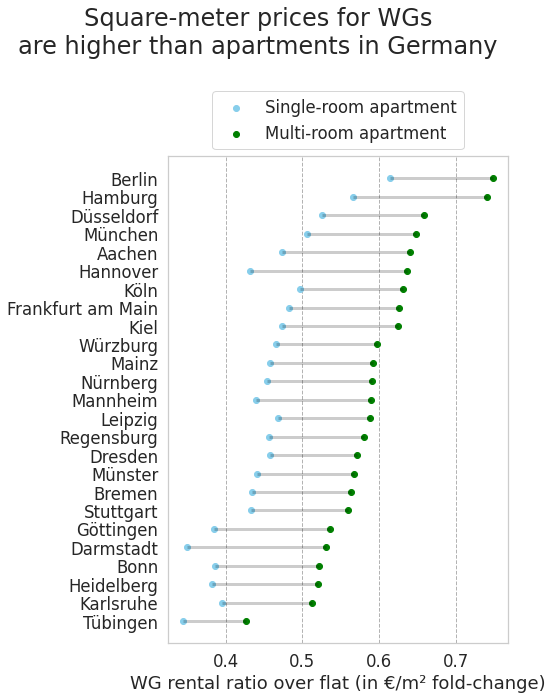

In [28]:
# Finding the order
ads_df_grouped = ads_df[['price_per_sqm', 'city', 'type_offer_simple']].groupby(['city','type_offer_simple']).mean().reset_index()
ads_df_grouped = ads_df_grouped.pivot(index='city', columns = 'type_offer_simple', values='price_per_sqm').reset_index()
ads_df_grouped['WGxApartment_ratio'] = ads_df_grouped['WG']/ads_df_grouped['Apartment']
ads_df_grouped['WGxHouse_ratio'] = ads_df_grouped['WG']/ads_df_grouped['House']
ads_df_grouped['WGxSingleroomflat_ratio'] = ads_df_grouped['WG']/ads_df_grouped['Single-room flat']
ads_df_grouped['ApartmentxSingleroomflat_ratio'] = ads_df_grouped['Apartment']/ads_df_grouped['Single-room flat']

# Reorder it following the values of the first value:
ordered_df = ads_df_grouped.sort_values(by = ['WGxApartment_ratio'], ascending=True).copy()
my_range=range(1,len(ordered_df)+1)

# Figure
sns.set_theme(style = "whitegrid", font_scale= 1.5)
fig, (ax1) = plt.subplots(nrows=1, ncols=1, figsize=(7.5, 10))


# The horizontal plot is made using the hline function
ax1.hlines(y=my_range, xmin=ordered_df['WGxSingleroomflat_ratio'], xmax=ordered_df['WGxApartment_ratio'], color='black', alpha=0.2, linewidth = 3)
ax1.scatter(ordered_df['WGxSingleroomflat_ratio'], my_range, color='skyblue', alpha=1, label='Single-room apartment')
ax1.scatter(ordered_df['WGxApartment_ratio'], my_range, color='green', alpha=1 , label='Multi-room apartment')
ax1.legend()
 
# Add title and axis names
ax1.set(title=None, #xlim=(1, 2),
        xlabel='WG rental ratio over flat (in €/m² fold-change)', ylabel=None)
ax1.set_yticks(my_range, ordered_df['city'])

ax1.legend(loc="upper center", bbox_to_anchor=(.5,1.15))

ax1.yaxis.grid(False)#,color='dimgray', linestyle='--', linewidth = 1)
ax1.xaxis.grid(True,color='dimgray', linestyle='--', linewidth = 1, alpha=0.5)



fig.suptitle('Square-meter prices for WGs\nare higher than apartments in Germany', fontsize=24)


# Show the graph
plt.tight_layout()
plt.show();

In [43]:
# This part of the code was adapted from: https://juanitorduz.github.io/germany_plots/
import geopandas as gpd
from config.config import ROOT_DIR

In [45]:
plz_shape_df = gpd.read_file(f'{ROOT_DIR}/housing_crawler/data/germany/plz-5stellig/plz-5stellig.shp', dtype={'plz': str})
# Create feature.
plz_shape_df.head()

,plz,note,qkm,einwohner,geometry
0,01067,01067 Dresden,6.866862,11957,"POLYGON ((13.68689 51.06395, 13.69570 51.06499..."
1,01069,01069 Dresden,5.351833,25491,"MULTIPOLYGON (((13.72009 51.04664, 13.72248 51..."
2,01097,01097 Dresden,3.297752,14821,"POLYGON ((13.72548 51.06860, 13.72629 51.06900..."
3,01099,01099 Dresden,58.506789,28018,"POLYGON ((13.74218 51.08979, 13.74335 51.08863..."
4,01108,01108 Dresden,16.447222,5876,"POLYGON ((13.76543 51.17491, 13.76637 51.17469..."


In [50]:
plz_region_df = pd.read_csv(f'{ROOT_DIR}/housing_crawler/data/germany/zuordnung_plz_ort.csv', 
    sep=',', 
    dtype={'plz': str}
)

plz_region_df.drop('osm_id', axis=1, inplace=True)

plz_region_df.head()

,ags,ort,plz,landkreis,bundesland
0,8335001,Aach,78267,Landkreis Konstanz,Baden-Württemberg
1,7235001,Aach,54298,Landkreis Trier-Saarburg,Rheinland-Pfalz
2,5334002,Aachen,52062,Städteregion Aachen,Nordrhein-Westfalen
3,5334002,Aachen,52064,Städteregion Aachen,Nordrhein-Westfalen
4,5334002,Aachen,52066,Städteregion Aachen,Nordrhein-Westfalen


In [51]:
# Merge data.
germany_df = pd.merge(
    left=plz_shape_df, 
    right=plz_region_df, 
    on='plz',
    how='inner'
)

germany_df.drop(['note'], axis=1, inplace=True)

germany_df.head()

,plz,qkm,einwohner,geometry,ags,ort,landkreis,bundesland
0,01067,6.866862,11957,"POLYGON ((13.68689 51.06395, 13.69570 51.06499...",14612000,Dresden,NaN,Sachsen
1,01069,5.351833,25491,"MULTIPOLYGON (((13.72009 51.04664, 13.72248 51...",14612000,Dresden,NaN,Sachsen
2,01097,3.297752,14821,"POLYGON ((13.72548 51.06860, 13.72629 51.06900...",14612000,Dresden,NaN,Sachsen
3,01099,58.506789,28018,"POLYGON ((13.74218 51.08979, 13.74335 51.08863...",14612000,Dresden,NaN,Sachsen
4,01108,16.447222,5876,"POLYGON ((13.76543 51.17491, 13.76637 51.17469...",14612000,Dresden,NaN,Sachsen


In [36]:
plz_einwohner_df = pd.read_csv(
    f'{ROOT_DIR}/housing_crawler/data/germany/plz_einwohner.csv', 
    sep=',', 
    dtype={'plz': str, 'einwohner': int}
)

plz_einwohner_df.head()

,plz,note,einwohner,qkm,lat,lon
0,01067,01067 Dresden,11957,6.866862,51.06019,13.71117
1,01069,01069 Dresden,25491,5.351816,51.03964,13.73030
2,01097,01097 Dresden,14821,3.297752,51.06945,13.73781
3,01099,01099 Dresden,28018,58.506789,51.09272,13.82842
4,01108,01108 Dresden,5876,16.447222,51.15180,13.79227


In [37]:
# Merge data.
germany_df = pd.merge(
    left=germany_df, 
    right=plz_einwohner_df.drop(columns = ['note', 'einwohner', 'qkm']), 
    on='plz',
    how='left'
)

germany_df.head()

,plz,qkm,einwohner,geometry,first_dig_plz,ags,ort,landkreis,bundesland,lat,lon
0,01067,6.866862,11957,"POLYGON ((13.68689 51.06395, 13.69570 51.06499...",0,14612000,Dresden,NaN,Sachsen,51.06019,13.71117
1,01069,5.351833,25491,"MULTIPOLYGON (((13.72009 51.04664, 13.72248 51...",0,14612000,Dresden,NaN,Sachsen,51.03964,13.73030
2,01097,3.297752,14821,"POLYGON ((13.72548 51.06860, 13.72629 51.06900...",0,14612000,Dresden,NaN,Sachsen,51.06945,13.73781
3,01099,58.506789,28018,"POLYGON ((13.74218 51.08979, 13.74335 51.08863...",0,14612000,Dresden,NaN,Sachsen,51.09272,13.82842
4,01108,16.447222,5876,"POLYGON ((13.76543 51.17491, 13.76637 51.17469...",0,14612000,Dresden,NaN,Sachsen,51.15180,13.79227


In [101]:
import folium
from folium.plugins import HeatMap, Fullscreen
import branca.colormap
from collections import defaultdict
from folium import GeoJson
from shapely.ops import unary_union
from housing_crawler.params import dict_city_number_wggesucht


In [136]:
from geojson import dump

def get_border_area(df, area, save = False):
    '''
    Returns the border of a specified region in Germany
    '''
    # Filter df accordingly
    if area.lower() == 'germany':
        return unary_union(germany_df['geometry'])
        
    
    df_filtered = df[df['bundesland'] == area]
    if len(df_filtered) == 0:
        df_filtered = df[df['ort'] == area]
        
    border = unary_union(df_filtered['geometry'])
    
    if save:
        with open(f'{ROOT_DIR}/housing_crawler/data/germany/{area}_border.geojson', 'w') as f:
           dump(border, f)
    
    return border

In [138]:
# ---------- create color legend -----------
mapObj = folium.Map(location=(51.1657, 10.4515), zoom_start=6, max_zoom = 18, width='75%', height='100%')


# Add Germany border
GeoJson(data = open(f'{ROOT_DIR}/housing_crawler/data/germany/germany_border.geojson', "r", encoding="utf-8-sig").read(),
        name='Germany',
        show=True,
        style_function=lambda x:{'fillColor': 'transparent','color': 'red', 'weight':0.5},
        zoom_on_click=True).add_to(mapObj)

# Add german states border
for area in list(set(germany_df['bundesland'])):
    GeoJson(data = open(f'{ROOT_DIR}/housing_crawler/data/germany/bundeslaender/{area}_border.geojson', "r", encoding="utf-8-sig").read(),
            name=area,
            show=True,
            style_function=lambda x:{'fillColor': 'transparent','color': 'red', 'weight':0.5},
            zoom_on_click=False).add_to(mapObj)
    
    
## Add cities borders
for area in list(dict_city_number_wggesucht.keys()):    
    GeoJson(data = open(f'{ROOT_DIR}/housing_crawler/data/germany/cities/{area}_border.geojson', "r", encoding="utf-8-sig").read(),
            name=area,
            show=True,
            style_function=lambda x:{'fillColor': 'transparent','color': 'black', 'weight':2},
            zoom_on_click=True).add_to(mapObj)


folium.LayerControl().add_to(mapObj)
Fullscreen(position='topleft',
           title='Full Screen',
           title_cancel='Exit Full Screen',
           force_separate_button=False).add_to(mapObj)

mapObj

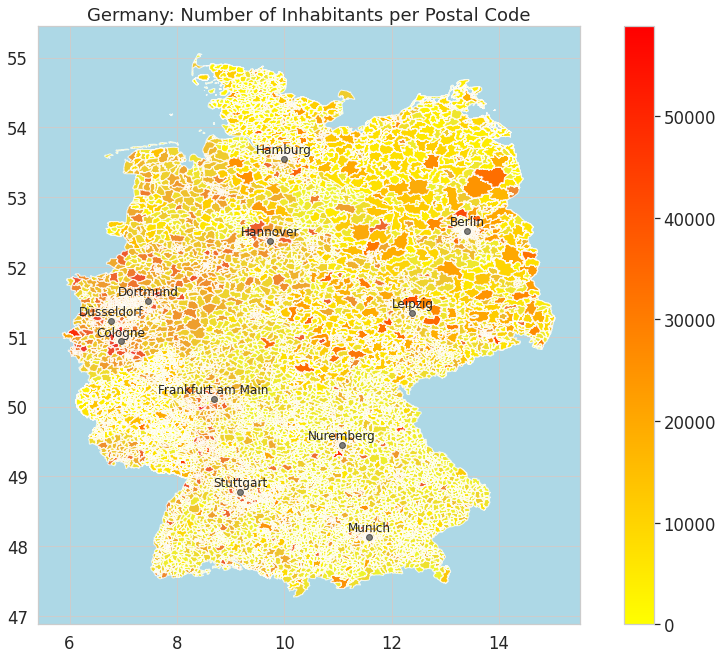

In [39]:
fig, ax = plt.subplots()

germany_df.plot(
    ax=ax, 
    column='einwohner', 
    categorical=False, 
    legend=True, 
    cmap='autumn_r',
    alpha=0.8
)

for c in top_cities.keys():

    ax.text(
        x=top_cities[c][0], 
        y=top_cities[c][1] + 0.08, 
        s=c, 
        fontsize=12,
        ha='center', 
    )

    ax.plot(
        top_cities[c][0], 
        top_cities[c][1], 
        marker='o',
        c='black', 
        alpha=0.5
    )
    
ax.set(
    title='Germany: Number of Inhabitants per Postal Code', 
    aspect=1.3, 
    facecolor='lightblue'
);

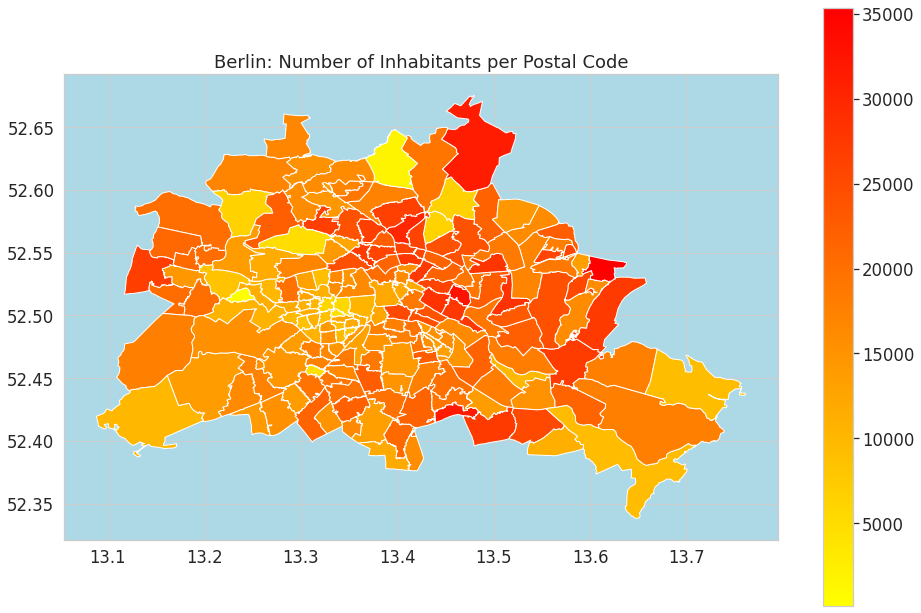

In [40]:
berlin_df = germany_df.query('ort == "Berlin"')

fig, ax = plt.subplots()

berlin_df.plot(
    ax=ax, 
    column='einwohner', 
    categorical=False, 
    legend=True, 
    cmap='autumn_r',
)

ax.set(
    title='Berlin: Number of Inhabitants per Postal Code', 
    aspect=1.3,
    facecolor='lightblue'
);

In [41]:
berlin_neighbourhoods_df = gpd.read_file(f'{ROOT_DIR}/housing_crawler/data/germany/berlin_neighbourhoods.geojson')

berlin_neighbourhoods_df = berlin_neighbourhoods_df \
    [~ berlin_neighbourhoods_df['neighbourhood_group'].isnull()]

berlin_neighbourhoods_df.head()

,neighbourhood,neighbourhood_group,geometry
0,Blankenfelde/Niederschönhausen,Pankow,"MULTIPOLYGON (((13.41191 52.61487, 13.41183 52..."
1,Helmholtzplatz,Pankow,"MULTIPOLYGON (((13.41405 52.54929, 13.41422 52..."
2,Wiesbadener Straße,Charlottenburg-Wilm.,"MULTIPOLYGON (((13.30748 52.46788, 13.30743 52..."
3,Schmöckwitz/Karolinenhof/Rauchfangswerder,Treptow - Köpenick,"MULTIPOLYGON (((13.70973 52.39630, 13.70926 52..."
4,Müggelheim,Treptow - Köpenick,"MULTIPOLYGON (((13.73762 52.40850, 13.73773 52..."


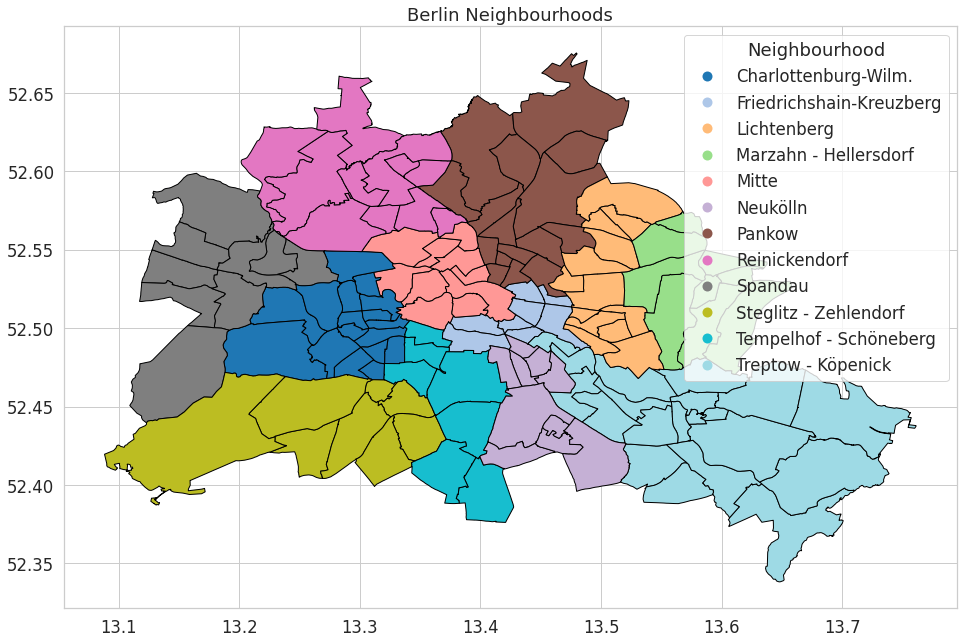

In [42]:
fig, ax = plt.subplots()

berlin_df.plot(
    ax=ax, 
    alpha=0.2
)

berlin_neighbourhoods_df.plot(
    ax=ax, 
    column='neighbourhood_group',
    categorical=True, 
    legend=True, 
    legend_kwds={'title': 'Neighbourhood', 'loc': 'upper right'},
    cmap='tab20', 
    edgecolor='black'
)

ax.set(
    title='Berlin Neighbourhoods', 
    aspect=1.3
);